In [3]:
import pandas as pd

In [4]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../scripts')))

In [5]:
from utils import *

In [6]:
df = pd.read_csv('../data/ethiopia1 (3).csv')

In [7]:
df.head()

,EVENT_ID_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,DISORDER_TYPE,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,INTER1,...,LOCATION,LATITUDE,LONGITUDE,GEO_PRECISION,SOURCE,SOURCE_SCALE,NOTES,FATALITIES,TAGS,TIMESTAMP
0,ETH10805,2023-10-20 00:00:00,2023,2,Political violence,Battles,Armed clash,OLF: Oromo Liberation Front (Shane Splinter Fa...,NaN,2,...,Gundo Meskel,10.250,38.733,2,Wazema Radio,New media,"Around 20 October 2023 (as reported), OLF Shan...",3,NaN,1698071505
1,ETH10816,2023-10-20 00:00:00,2023,2,Political violence,Battles,Armed clash,OLF: Oromo Liberation Front (Shane Splinter Fa...,NaN,2,...,Bake Kelate,9.614,37.985,2,Addis Maleda,National,"Around 20 October 2023 (as reported), OLF Shan...",10,NaN,1698071505
2,ETH10840,2023-10-20 00:00:00,2023,2,Strategic developments,Strategic developments,Other,Police Forces of Ethiopia (2018-) Oromia State...,NaN,1,...,Ano,9.093,36.958,1,ESAT,International,Non-violent activity: Around 20 October 2023 (...,0,NaN,1698071505
3,ETH10799,2023-10-19 00:00:00,2023,1,Political violence,Violence against civilians,Abduction/forced disappearance,OLF: Oromo Liberation Front (Shane Splinter Fa...,NaN,2,...,Fiche,9.800,38.733,1,EMS,Other,"On 19 October 2023, OLF Shane abducted nine Ch...",0,NaN,1698071505
4,ETH10803,2023-10-19 00:00:00,2023,1,Political violence,Battles,Armed clash,Military Forces of Ethiopia (2018-),NaN,1,...,Bure,10.700,37.067,2,EMS,Other,"On 19 October 2023, ENDF and Fano clashed at W...",10,NaN,1698071505


In [8]:
df.columns

Index(['EVENT_ID_CNTY', 'EVENT_DATE', 'YEAR', 'TIME_PRECISION',
       'DISORDER_TYPE', 'EVENT_TYPE', 'SUB_EVENT_TYPE', 'ACTOR1',
       'ASSOC_ACTOR_1', 'INTER1', 'ACTOR2', 'ASSOC_ACTOR_2', 'INTER2',
       'INTERACTION', 'CIVILIAN_TARGETING', 'ISO', 'REGION', 'COUNTRY',
       'ADMIN1', 'ADMIN2', 'ADMIN3', 'LOCATION', 'LATITUDE', 'LONGITUDE',
       'GEO_PRECISION', 'SOURCE', 'SOURCE_SCALE', 'NOTES', 'FATALITIES',
       'TAGS', 'TIMESTAMP'],
      dtype='object')

In [9]:
column_summary(df)

,col_name,col_dtype,num_of_nulls,num_of_non_nulls,num_of_distinct_values,distinct_values_counts
0,EVENT_ID_CNTY,object,0,10660,10660,"{'ETH10805': 1, 'ETH3627': 1, 'ETH3622': 1, 'E..."
1,EVENT_DATE,object,0,10660,3484,"{'2016-08-06 00:00:00': 103, '2020-11-15 00:00..."
2,YEAR,int64,0,10660,27,"{2021: 1875, 2022: 1570, 2016: 1218, 2023: 120..."
3,TIME_PRECISION,int64,0,10660,3,"{1: 8489, 2: 1413, 3: 758}"
4,DISORDER_TYPE,object,0,10660,4,"{'Political violence': 7194, 'Demonstrations':..."
5,EVENT_TYPE,object,0,10660,6,"{'Battles': 4428, 'Protests': 2391, 'Violence ..."
6,SUB_EVENT_TYPE,object,0,10660,24,"{'Armed clash': 4166, 'Attack': 2017, 'Peacefu..."
7,ACTOR1,object,0,10660,160,"{'Protesters (Ethiopia)': 2374, 'Military Forc..."
8,ASSOC_ACTOR_1,object,7458,3202,231,"{'Oromo Ethnic Group (Ethiopia)': 916, 'Milita..."
9,INTER1,int64,0,10660,8,"{1: 4163, 6: 2393, 2: 1403, 3: 1213, 4: 797, 5..."


In [10]:
numeric_columns = get_numeric_columns(df)

In [11]:
df.INTER1.value_counts()

INTER1
1    4163
6    2393
2    1403
3    1213
4     797
5     558
8     122
7      11
Name: count, dtype: int64

## Filling Missing Values in a DataFrame

In [12]:
# Replace the missing values with 'unknown'
missing_columns = ['ASSOC_ACTOR_1', 'ASSOC_ACTOR_2', 'ACTOR2', 'CIVILIAN_TARGETING']
for col in missing_columns:
    df[col].fillna('Unknown', inplace=True)


# Replace the missing value of TAGS with 'no report'
df['TAGS'].fillna('no report', inplace=True)

In [13]:
df.describe()

,YEAR,TIME_PRECISION,INTER1,INTER2,INTERACTION,ISO,LATITUDE,LONGITUDE,GEO_PRECISION,FATALITIES,TIMESTAMP
count,10660.000000,10660.000000,10660.000000,10660.000000,10660.000000,10660.0,10660.000000,10660.000000,10660.000000,10660.000000,1.066000e+04
mean,2017.268293,1.274765,3.001595,3.043527,27.298124,231.0,9.753713,38.960423,1.474109,6.320075,1.646133e+09
std,6.119005,0.584393,2.073944,2.721625,18.817836,0.0,2.334133,2.232340,0.548420,42.303100,3.221665e+07
min,1997.000000,1.000000,1.000000,0.000000,10.000000,231.0,3.450000,33.086000,1.000000,0.000000,1.552577e+09
25%,2016.000000,1.000000,1.000000,1.000000,13.000000,231.0,8.550000,37.550000,1.000000,0.000000,1.618530e+09
50%,2020.000000,1.000000,2.000000,2.000000,17.000000,231.0,9.350000,38.771000,1.000000,0.000000,1.639526e+09
75%,2022.000000,1.000000,5.000000,7.000000,44.000000,231.0,11.515000,39.896000,2.000000,3.000000,1.679931e+09
max,2023.000000,3.000000,8.000000,8.000000,88.000000,231.0,14.695000,45.529000,3.000000,1172.000000,1.698072e+09


## Distribution Analysis

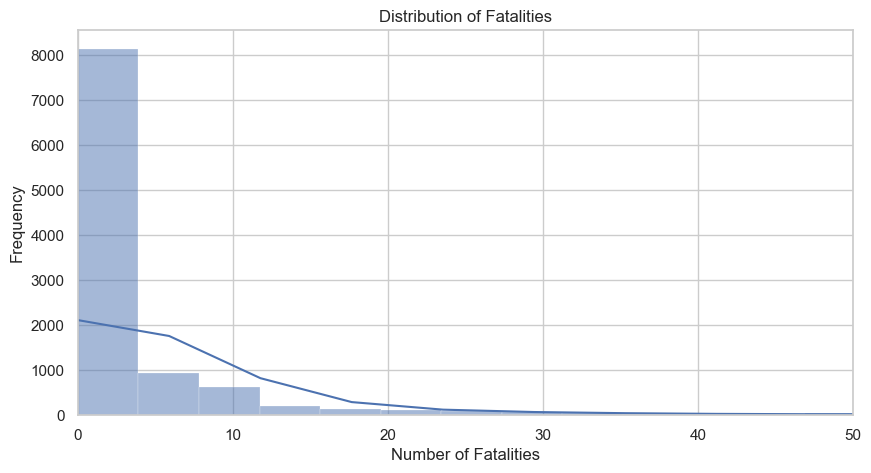

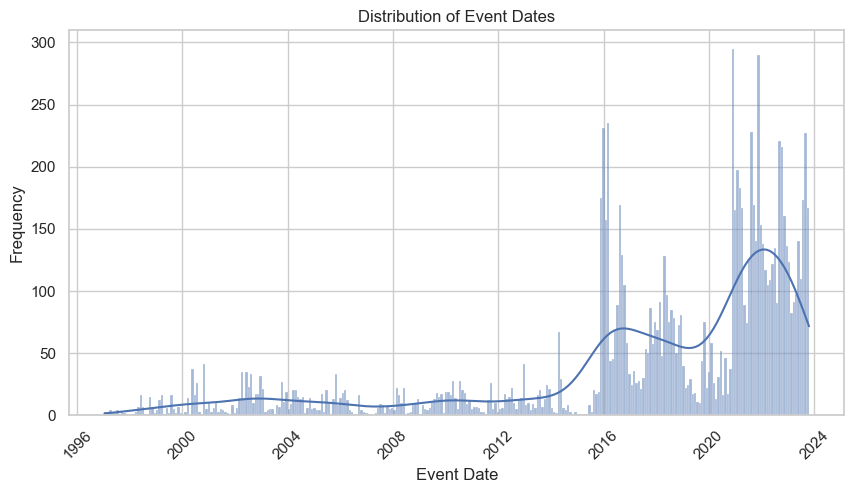

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plots
sns.set(style="whitegrid")

# Create a histogram for fatalities
plt.figure(figsize=(10, 5))
sns.histplot(df['FATALITIES'], bins=300, kde=True)
plt.xlim(0, 50)
plt.title('Distribution of Fatalities')
plt.xlabel('Number of Fatalities')
plt.ylabel('Frequency')
plt.show()

# Create a histogram for event dates
df['EVENT_DATE'] = pd.to_datetime(df['EVENT_DATE'])
plt.figure(figsize=(10, 5))
sns.histplot(df['EVENT_DATE'], bins=300, kde=True)
plt.title('Distribution of Event Dates')
plt.xlabel('Event Date')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

## Correlation Analysis

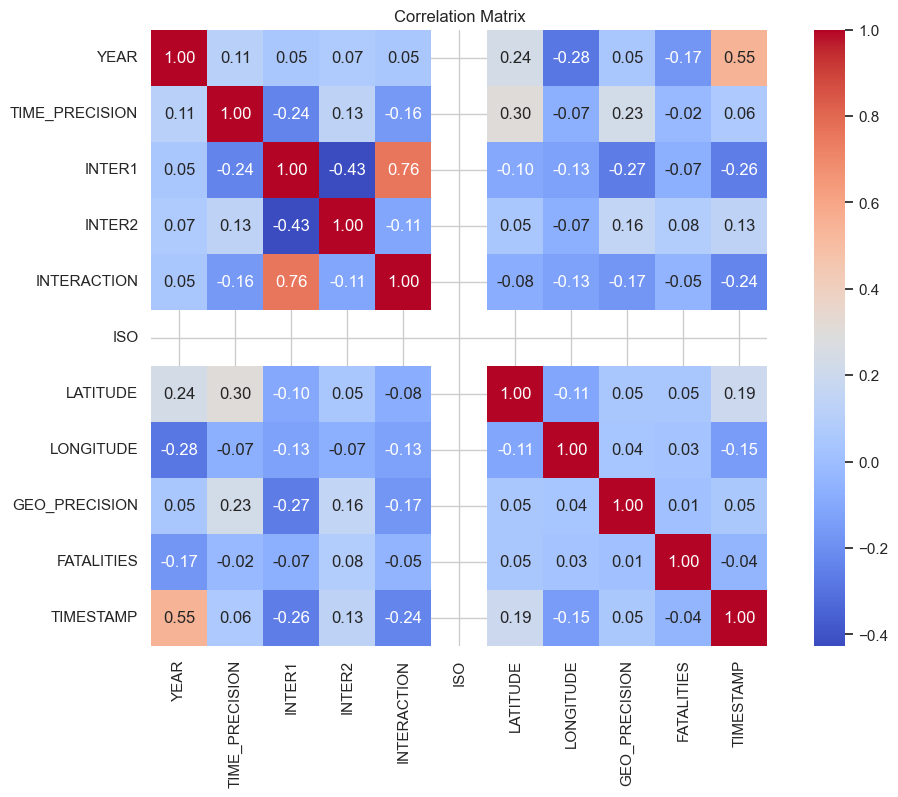

In [15]:
# Calculate the correlation matrix
numeric_df = df.select_dtypes(include=['number'])

correlation_matrix = numeric_df.corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix')
plt.show()


## Event Type Analysis

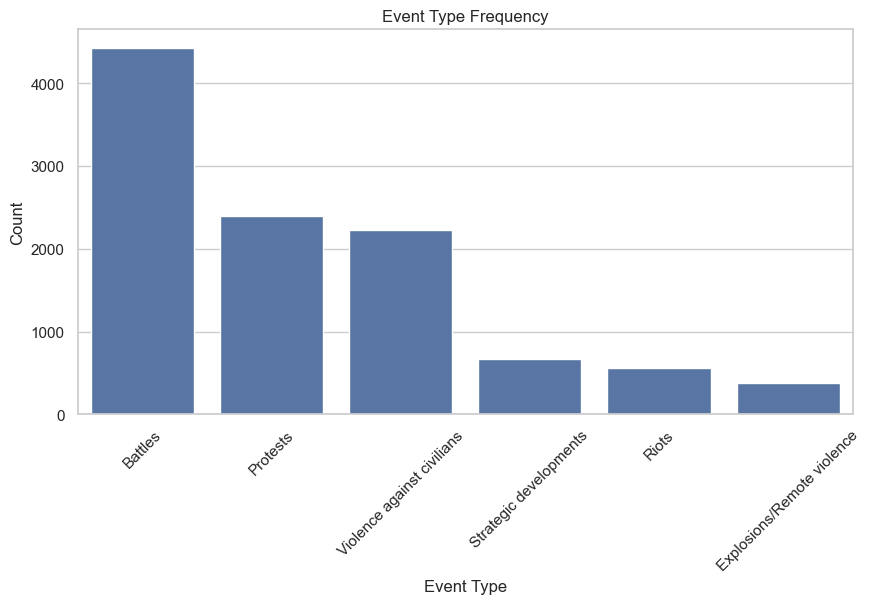

In [16]:
# Count the occurrences of each event type
event_type_counts = df['EVENT_TYPE'].value_counts()

# Plot the event type counts
plt.figure(figsize=(10, 5))
sns.barplot(x=event_type_counts.index, y=event_type_counts.values)
plt.title('Event Type Frequency')
plt.xlabel('Event Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


## Geographic Analysis

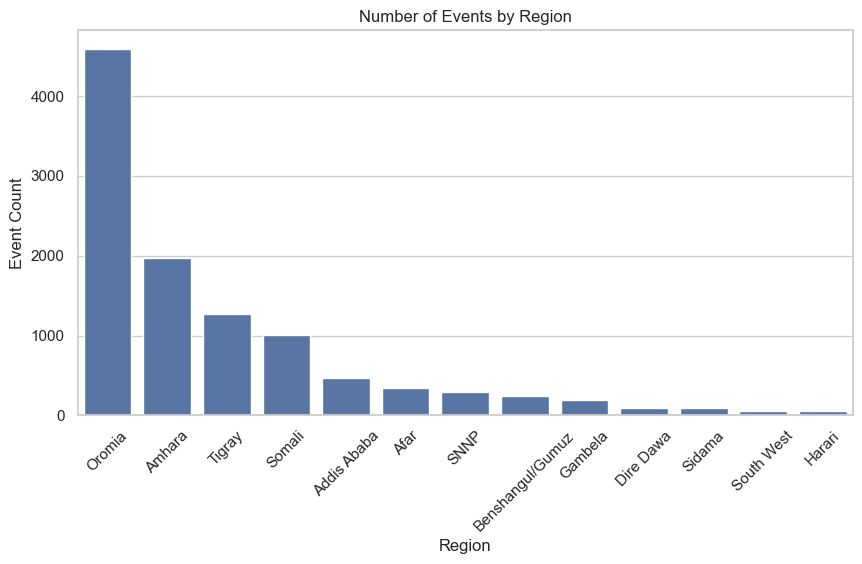

In [17]:
# Count occurrences of each region
region_counts = df['ADMIN1'].value_counts()

# Plot the region counts
plt.figure(figsize=(10, 5))
sns.barplot(x=region_counts.index, y=region_counts.values)
plt.title('Number of Events by Region')
plt.xlabel('Region')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.show()


## Time Series Analysis

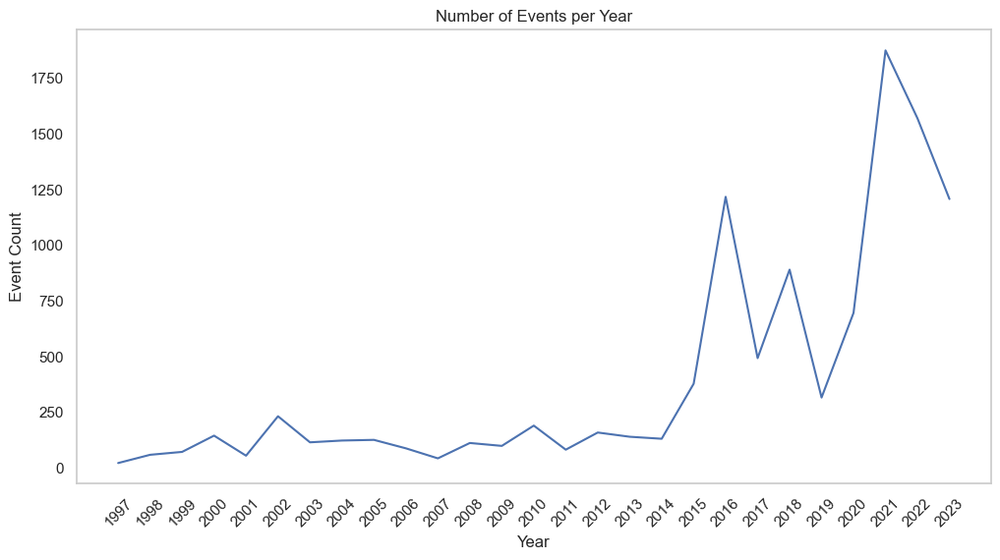

In [18]:
# Count the number of events per year
events_per_year = df['YEAR'].value_counts().sort_index()

# Plot the number of events per year
plt.figure(figsize=(12, 6))
sns.lineplot(x=events_per_year.index, y=events_per_year.values)
plt.title('Number of Events per Year')
plt.xlabel('Year')
plt.ylabel('Event Count')
plt.xticks(events_per_year.index, rotation=45)
plt.grid()
plt.show()


## Fatalities Analysis

### Average Fatalities by Event Type

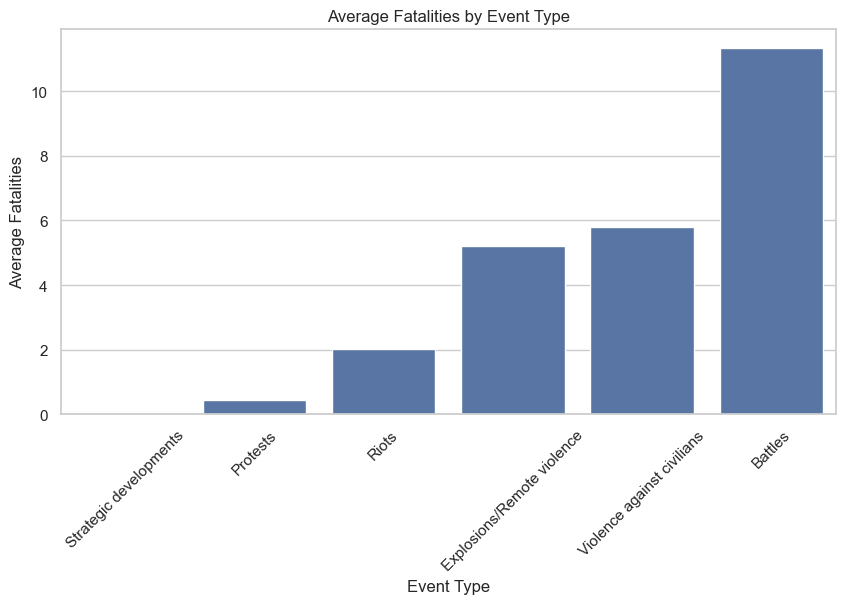

In [19]:
# Calculate average fatalities by event type
avg_fatalities_event_type = df.groupby('EVENT_TYPE')['FATALITIES'].mean().sort_values()

# Plot average fatalities by event type
plt.figure(figsize=(10, 5))
sns.barplot(x=avg_fatalities_event_type.index, y=avg_fatalities_event_type.values)
plt.title('Average Fatalities by Event Type')
plt.xlabel('Event Type')
plt.ylabel('Average Fatalities')
plt.xticks(rotation=45)
plt.show()


## Event Type Analysis

### Event Type Distribution

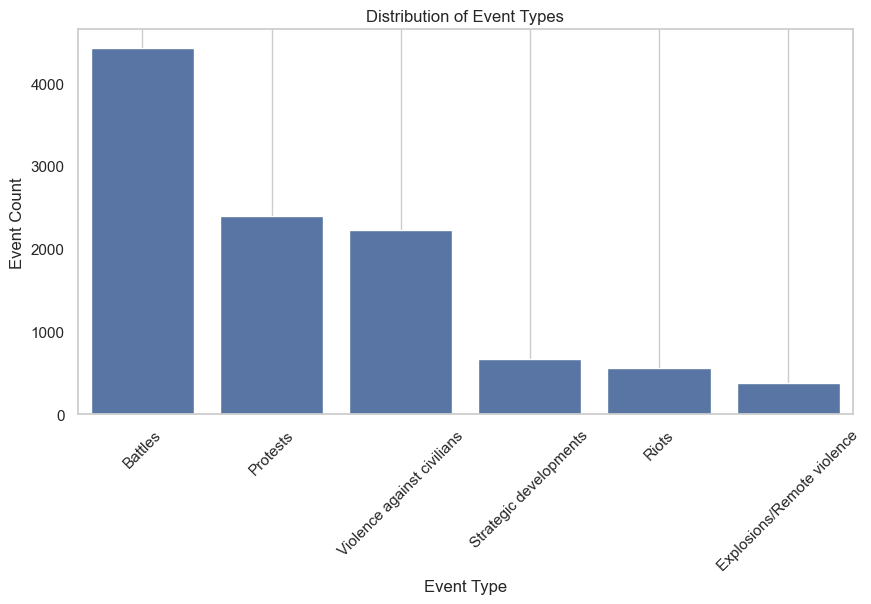

In [20]:
# Count occurrences of each event type
event_type_counts = df['EVENT_TYPE'].value_counts()

# Plot the event type distribution
plt.figure(figsize=(10, 5))
sns.barplot(x=event_type_counts.index, y=event_type_counts.values)
plt.title('Distribution of Event Types')
plt.xlabel('Event Type')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()


###  Interaction Analysis

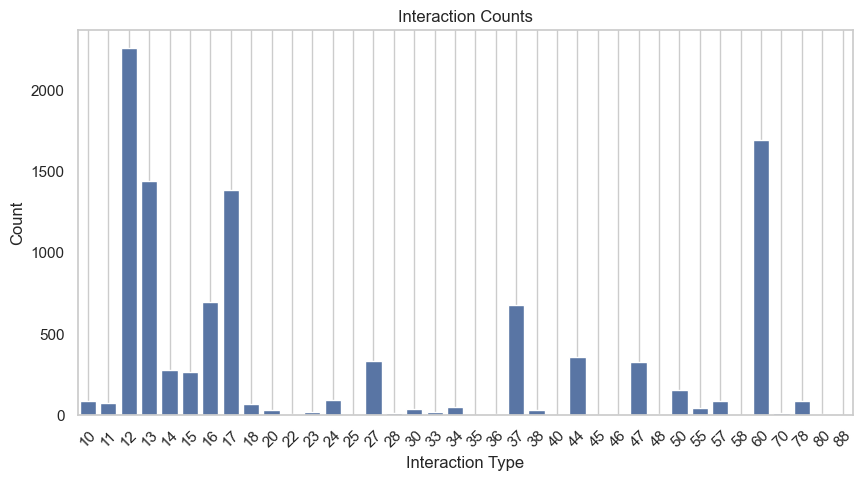

In [21]:
# Count occurrences of interactions
interaction_counts = df['INTERACTION'].value_counts()

# Plot the interaction counts
plt.figure(figsize=(10, 5))
sns.barplot(x=interaction_counts.index, y=interaction_counts.values)
plt.title('Interaction Counts')
plt.xlabel('Interaction Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()


## Geospatial Analysis

In [22]:
import folium

# Create a base map
m = folium.Map(location=[9.145, 40.489673], zoom_start=6)

# Add points for each event
for _, row in df.iterrows():
    folium.CircleMarker(
        location=(row['LATITUDE'], row['LONGITUDE']),
        radius=3,
        color='red' if row['FATALITIES'] > 0 else 'blue',
        fill=True,
        fill_color='red' if row['FATALITIES'] > 0 else 'blue',
        fill_opacity=0.6,
        popup=f"Event: {row['EVENT_TYPE']}<br>Fatalities: {row['FATALITIES']}"
    ).add_to(m)

# Display the map
display(m)


## Actor Analysis

### Most Active Actors

C:\Users\Admin\AppData\Local\Temp\ipykernel_20444\658650611.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_actors.values, y=top_actors.index, palette='viridis')


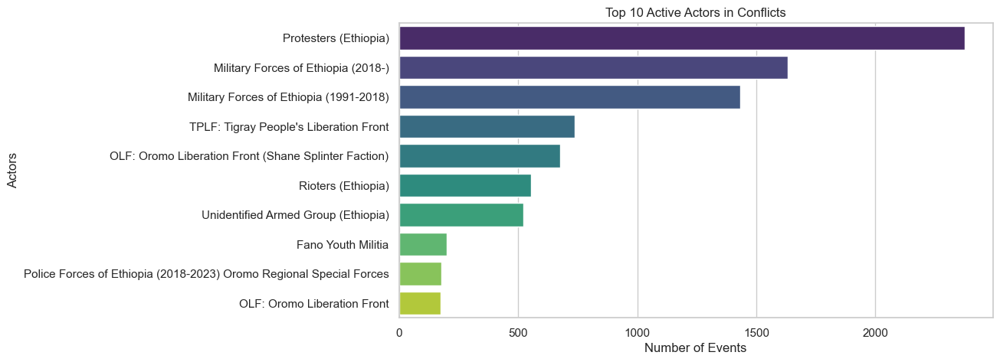

In [24]:
# Count the number of events per actor
top_actors = df['ACTOR1'].value_counts().head(10)

# Plot the top actors
plt.figure(figsize=(10, 5))
sns.barplot(x=top_actors.values, y=top_actors.index, palette='viridis')
plt.title('Top 10 Active Actors in Conflicts')
plt.xlabel('Number of Events')
plt.ylabel('Actors')
plt.show()
